# **Scaling, Re-sizing, Interpolations and Cropping**

**In this lesson we'll learn:**
1. How to re-size and scale images
2. Image Pyramids
3. Cropping

### **Re-sizing**

![](https://github.com/rajeevratan84/ModernComputerVision/raw/main/Resizing.png)

Re-sizing is a simple function that we execute using the cv2.resize function, it's arguments are:

```cv2.resize(image, dsize(output image size), x scale, y scale, interpolation)```
- if dsize is None the output image is calculated as a function of scaling using x & y scale 

#### **List of Interpolation Methods:**
- cv2.INTER_AREA - Good for shrinking or down sampling
- cv2.INTER_NEAREST - Fastest
- cv2.INTER_LINEAR - Good for zooming or up sampling (default)
- cv2.INTER_CUBIC - Better
- cv2.INTER_LANCZOS4 - Best

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def imshow(title = "Image", image = None, size = 10):
    w, h = image.shape[0], image.shape[1]
    aspect_ratio = w/h
    plt.figure(figsize=(size * aspect_ratio,size))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.show()


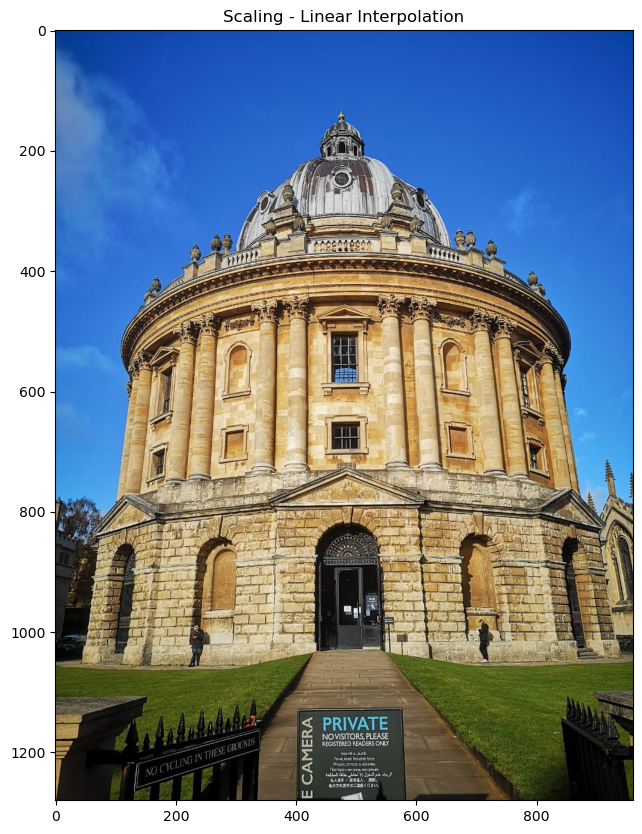

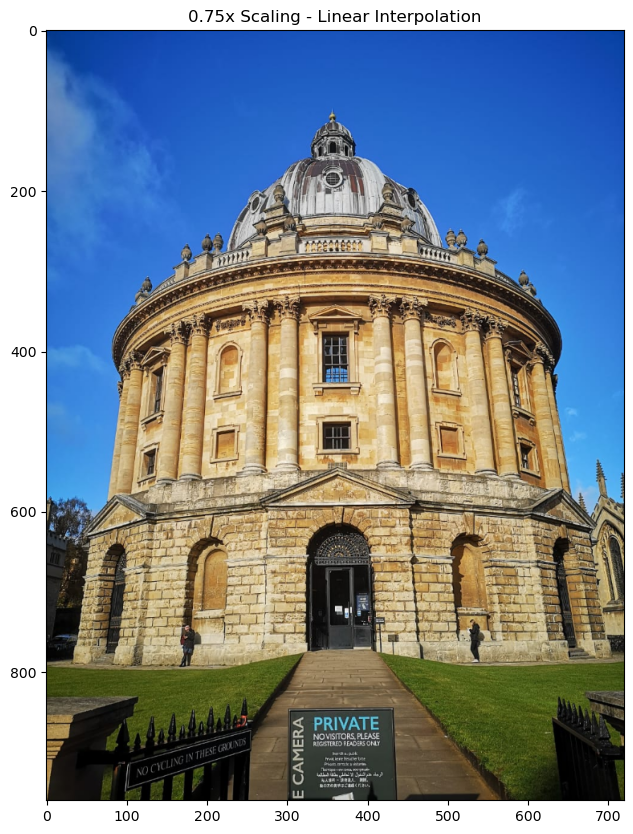

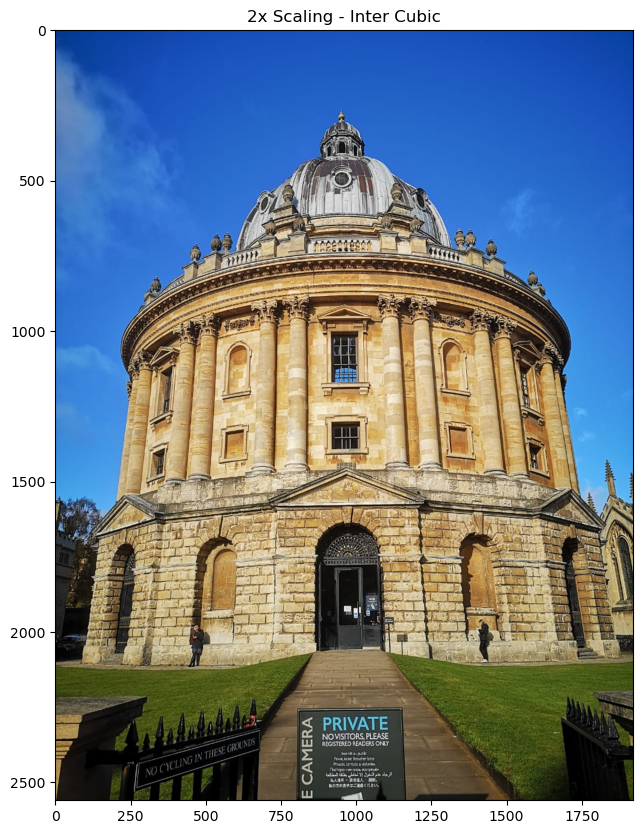

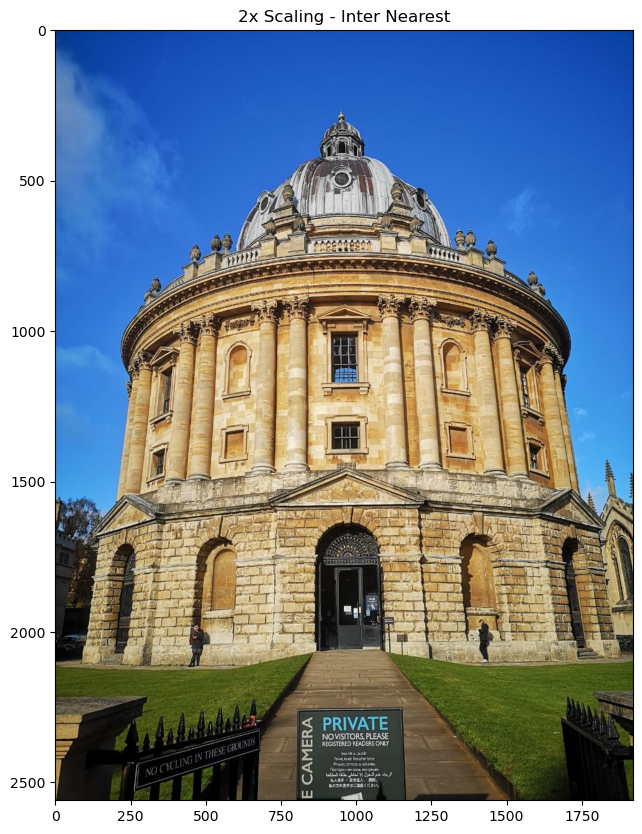

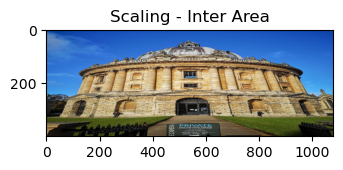

In [9]:
image = cv2.imread('images/oxfordlibrary.jpeg')
imshow("Scaling - Linear Interpolation", image)


image_scaled = cv2.resize(image, None, fx=0.75, fy=0.1)
imshow("0.75x Scaling - Linear Interpolation", image_scaled)

img_scaled2 = cv2.resize(image, None, fx=2, fy=2, interpolation = cv2.INTER_CUBIC)
imshow("2x Scaling - Inter Cubic", img_scaled2)

img_scaled3 = cv2.resize(image, None, fx=2, fy=2, interpolation = cv2.INTER_NEAREST)
imshow("2x Scaling - Inter Nearest", img_scaled3)

img_scaled4 = cv2.resize(image, (900, 400), interpolation = cv2.INTER_AREA)
imshow("Scaling - Inter Area", img_scaled4)

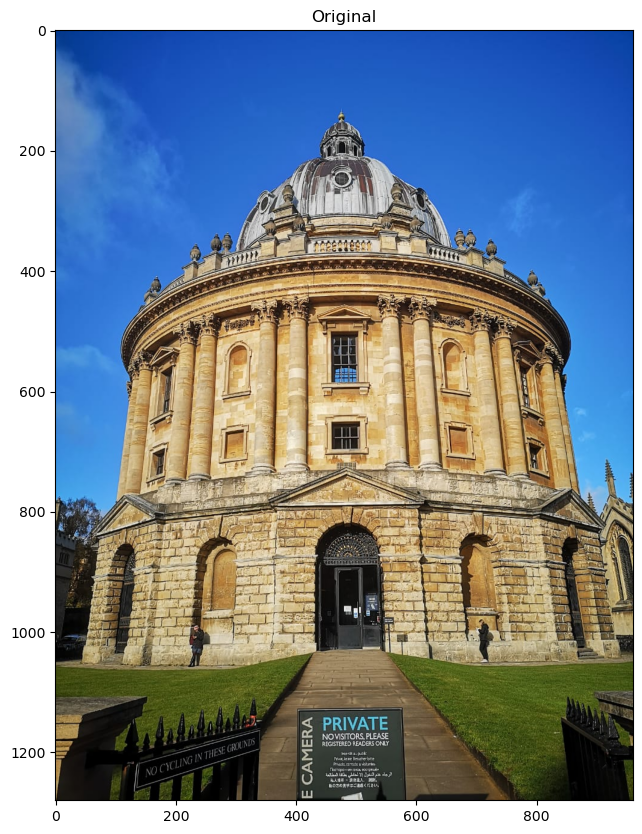

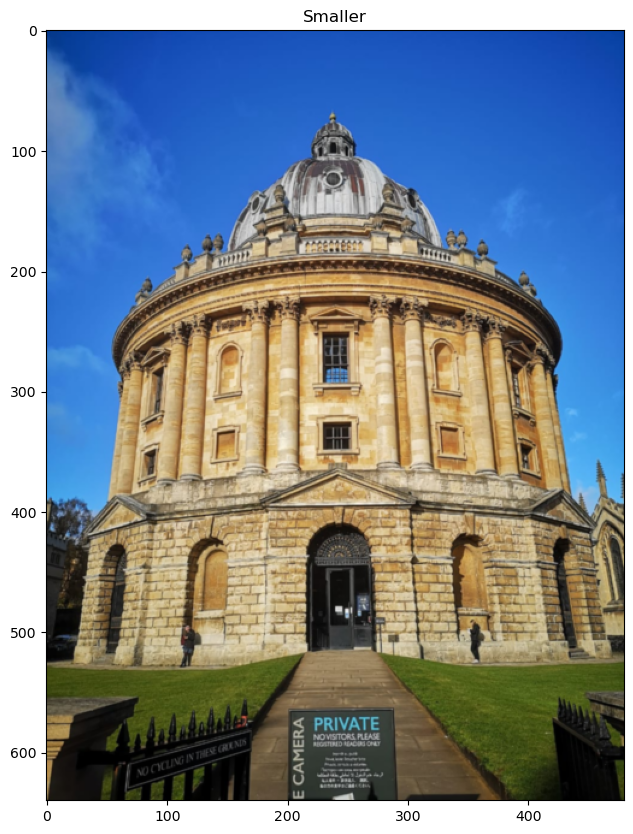

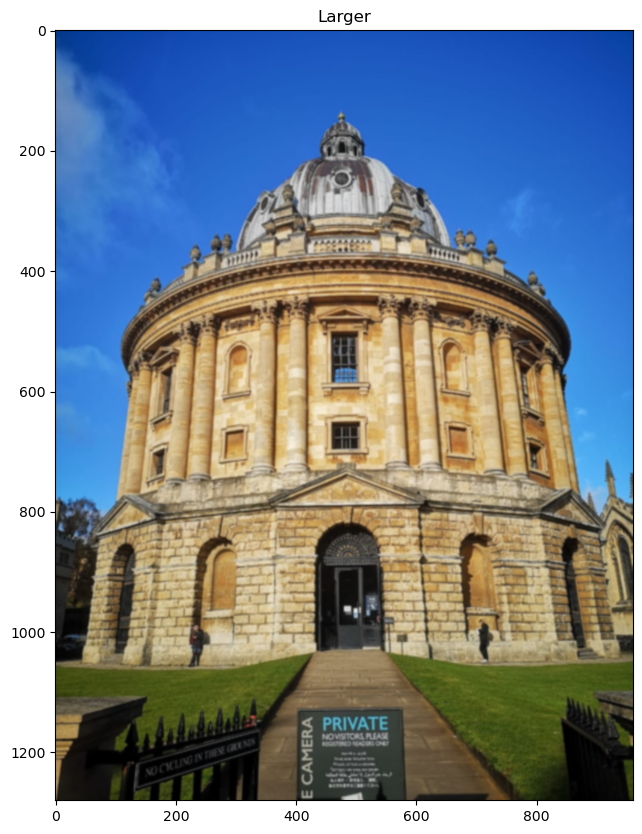

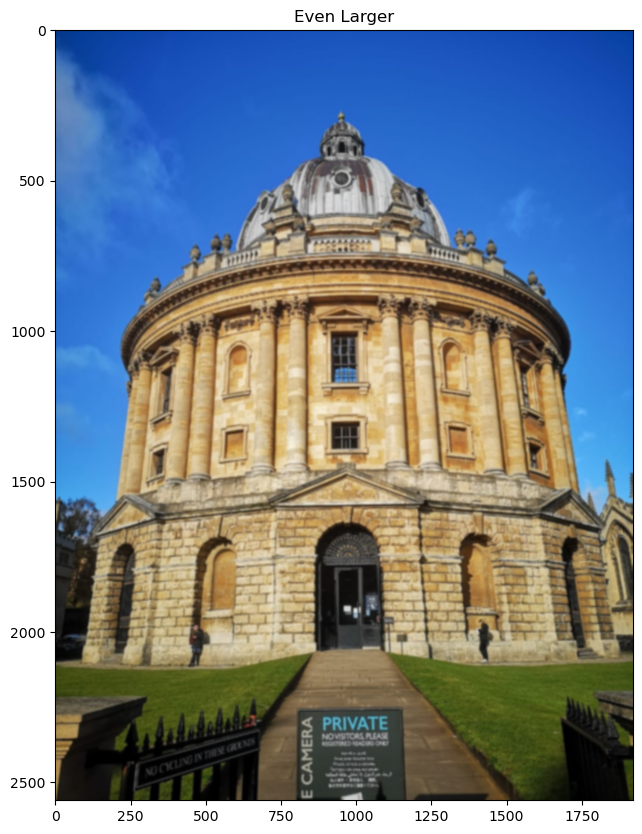

In [10]:
#Image Pyraminds

smaller = cv2.pyrDown(image)
larger = cv2.pyrUp(smaller)
even_larger = cv2.pyrUp(larger)

imshow("Original", image)
imshow('Smaller', smaller)
imshow('Larger', larger)
imshow('Even Larger', even_larger)


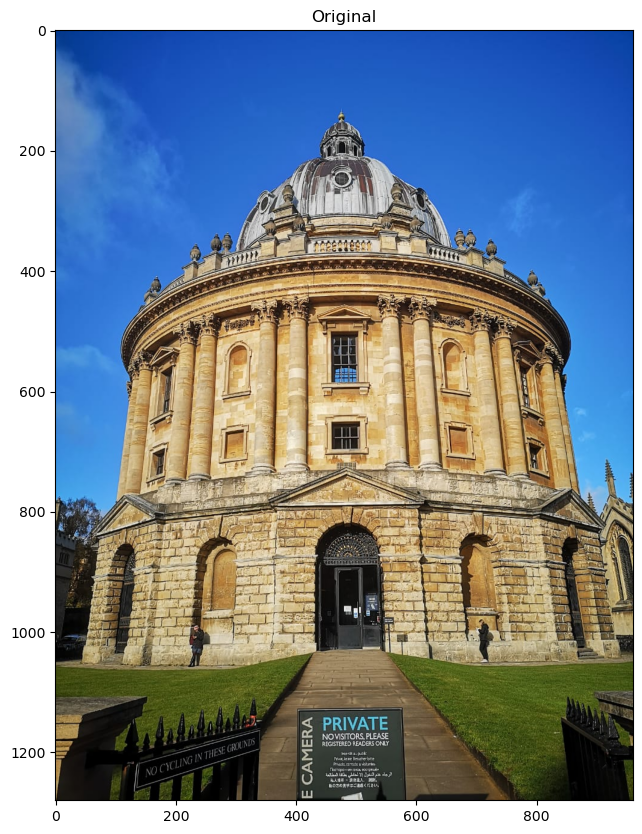

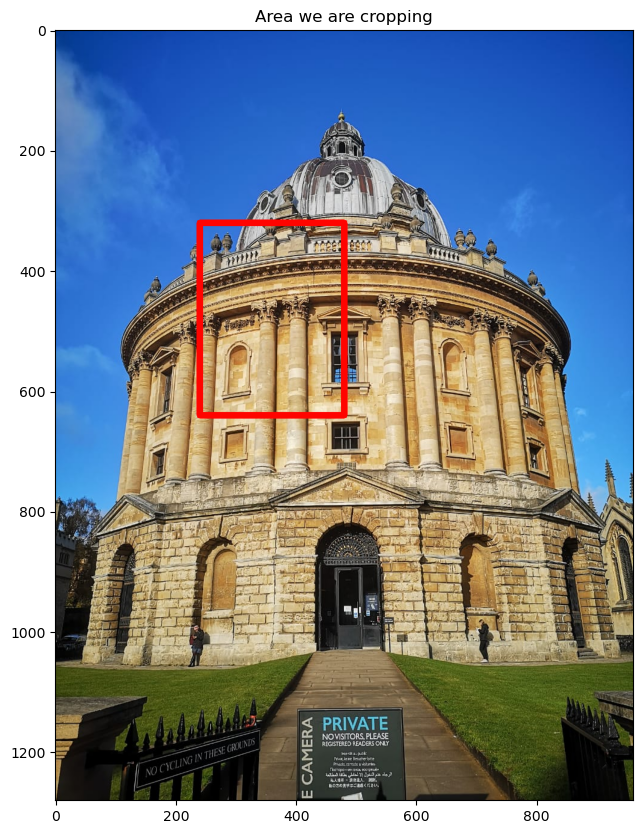

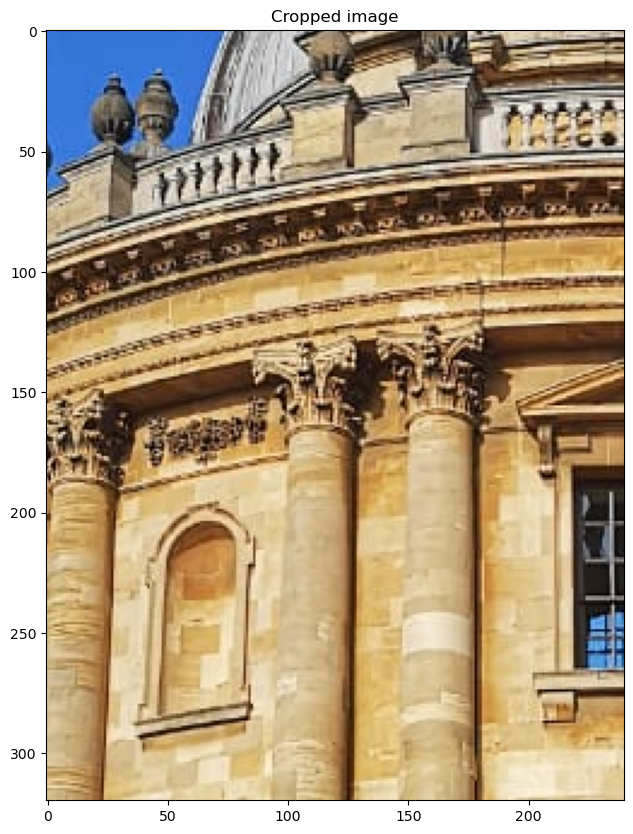

In [15]:
height, width = image.shape[:2]

start_row, start_col = int(height * .25), int(width * 0.25)
end_row, end_col = int(height * 0.5), int(width * 0.5)

cropped = image[start_row:end_row, start_col:end_col]

imshow('Original', image)

copy = image.copy()
cv2.rectangle(copy, (start_col, start_row), (end_col, end_row), (0,4,255),10)

imshow('Area we are cropping', copy)
imshow('Cropped image', cropped)

